---

# <center>**Number 4**</center>

---

## **Import Module**

First, it is needed to import some module to make the analyze process easier. 
- Pandas module is used to manipulate data from csv and store it to DataFrame type.
- Numpy module is used to do the comprehensive mathematical functions.
- OS module is used to list all file in specific directory.
- Matplotlib module is used to plot the data into the usefull chart or figure.
- Time module is used to represent time in code.
- Webdriver from Selenium module is used to control the browser natively. This is used for browser automation.
- Folium module is used to map the flight data, airport, and the runway.
- Random module is used to give random choices from given data.
- Image from Pillow module is used to represent the images from the array and used to convert the images into the array for storing it to the DataFrame

In [59]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

import time
from selenium import webdriver
import folium
import random
from PIL import Image

## **Airport Data from `airports.csv`**

Because the data that is given to the student only consists of flight data and the student needs to search the airport and runway from the flight data, it is necessary to search airport and runway dataset from the internet. In here, the airport and runway data is gotten from [OurAirports](https://ourairports.com/data/).

To get the Airport Data from csv file, pandas module is used. The method to read the csv file is `.read_csv()`. It can be seen that there are several columns that is useless for the analysis. Hence, it is better to delete some columns, like `home_link`, `wikipedia_link`, and `keywords`. To do that, the method to delete the columns is `.drop()`.

In [2]:
airport = pd.read_csv('airports.csv')
airport.drop(columns=['home_link', 'wikipedia_link', 'keywords'], inplace=True)
airport

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code
0,6523,00A,heliport,Total Rf Heliport,40.070801,-74.933601,11.0,NaN,US,US-PA,Bensalem,no,00A,NaN,00A
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,3435.0,NaN,US,US-KS,Leoti,no,00AA,NaN,00AA
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,450.0,NaN,US,US-AK,Anchor Point,no,00AK,NaN,00AK
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,820.0,NaN,US,US-AL,Harvest,no,00AL,NaN,00AL
4,6526,00AR,closed,Newport Hospital & Clinic Heliport,35.608700,-91.254898,237.0,NaN,US,US-AR,Newport,no,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72008,46378,ZZ-0001,heliport,Sealand Helipad,51.894444,1.482500,40.0,EU,GB,GB-ENG,Sealand,no,NaN,NaN,NaN
72009,307326,ZZ-0002,small_airport,Glorioso Islands Airstrip,-11.584278,47.296389,11.0,AF,TF,TF-U-A,Grande Glorieuse,no,NaN,NaN,NaN
72010,346788,ZZ-0003,small_airport,Fainting Goat Airport,32.110587,-97.356312,690.0,NaN,US,US-TX,Blum,no,87TX,NaN,87TX
72011,342102,ZZZW,closed,Scandium City Heliport,69.355287,-138.939310,4.0,NaN,CA,CA-YT,(Old) Scandium City,no,ZZZW,ZYW,YK96


It can be seen from the `type` column that there are several types of the airport. To get all the type of the airport, `.unique()` method can be used.

In [3]:
airport_types = airport['type'].unique()
airport_types

array(['heliport', 'small_airport', 'closed', 'seaplane_base',
       'balloonport', 'medium_airport', 'large_airport'], dtype=object)

Because the flight data is recorded from B747 aircraft, the possible type of airport is only `small_airport`,`medium_airport`, and `large_airport`. Hence, other than these types of airport needs to be deleted.

In [4]:
airport_delete_type = []
for airport_type in airport_types:
    if not 'airport' in airport_type:
        airport_delete_type.append(airport_type)

airport_delete_type

['heliport', 'closed', 'seaplane_base', 'balloonport']

From above, it can be seen that `heliport`, `seaplane_base`, `balloonport`, and `closed` needs to be deleted from `airport` table. Hence, this syntax is used:

In [5]:
for type in airport_delete_type:
    airport.drop(airport[airport['type'] == type].index, inplace=True)

airport

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,3435.0,NaN,US,US-KS,Leoti,no,00AA,NaN,00AA
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,450.0,NaN,US,US-AK,Anchor Point,no,00AK,NaN,00AK
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,820.0,NaN,US,US-AL,Harvest,no,00AL,NaN,00AL
5,322127,00AS,small_airport,Fulton Airport,34.942803,-97.818019,1100.0,NaN,US,US-OK,Alex,no,00AS,NaN,00AS
6,6527,00AZ,small_airport,Cordes Airport,34.305599,-112.165001,3810.0,NaN,US,US-AZ,Cordes,no,00AZ,NaN,00AZ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72006,317861,ZYYK,medium_airport,Yingkou Lanqi Airport,40.542524,122.358600,NaN,AS,CN,CN-21,"Laobian, Yingkou",yes,ZYYK,YKH,NaN
72007,32753,ZYYY,medium_airport,Shenyang Dongta Airport,41.784401,123.496002,NaN,AS,CN,CN-21,"Dadong, Shenyang",no,ZYYY,NaN,NaN
72009,307326,ZZ-0002,small_airport,Glorioso Islands Airstrip,-11.584278,47.296389,11.0,AF,TF,TF-U-A,Grande Glorieuse,no,NaN,NaN,NaN
72010,346788,ZZ-0003,small_airport,Fainting Goat Airport,32.110587,-97.356312,690.0,NaN,US,US-TX,Blum,no,87TX,NaN,87TX


To verify that all of the type other than airport has been deleted, this syntax is used:

In [6]:
airport['type'].unique()

array(['small_airport', 'medium_airport', 'large_airport'], dtype=object)

Because the type that is exists in `airport` table only the airport, hence the airport data has been successfully cleaned and can be processed furtherly.

## **Runway Data from `runways.csv`**

Because the runways dataset is provided in the comma-separated values, the method `.read_csv()` from `pandas` is used to read the data and store it into the DataFrame Table. Also, it can be seen that there are some columns that is useless for the analysis, like `surface`, `lighted`, and `closed`. Hence, this column is dropped. Also, because the analysis (which is explained later) is based on the latitude and longitude, all of the `NaN` values from latitude and longitude of the data will be deleted. Hence, the runways data is stored into the DataFrame `runway` as follows.

In [7]:
runway = pd.read_csv('runways.csv')
runway.drop(columns=['surface', 'lighted', 'closed'])
runway.dropna(subset=['le_latitude_deg'], inplace=True)
runway

,id,airport_ref,airport_ident,length_ft,width_ft,surface,lighted,closed,le_ident,le_latitude_deg,le_longitude_deg,le_elevation_ft,le_heading_degT,le_displaced_threshold_ft,he_ident,he_latitude_deg,he_longitude_deg,he_elevation_ft,he_heading_degT,he_displaced_threshold_ft
6,245528,6528,00CA,6000.0,80.0,ASPH,0,0,04,35.349300,-116.892998,NaN,50.0,NaN,22,35.360298,-116.877998,NaN,NaN,NaN
50,240309,6572,00WI,1000.0,60.0,TURF,0,0,09,44.304199,-89.052002,NaN,87.2,NaN,27,44.304401,-89.048203,NaN,NaN,200.0
59,256815,6581,01C,2517.0,120.0,TURF-G,1,0,09,43.341702,-85.779900,815.0,NaN,387.0,27,43.341702,-85.770302,815.0,NaN,580.0
72,258036,6530,01ID,2894.0,100.0,TURF-F,0,0,14,42.611000,-112.035004,NaN,NaN,NaN,32,42.603699,-112.030998,NaN,NaN,NaN
76,254664,6597,01J,3365.0,125.0,TURF-P,1,0,18,30.690901,-81.906403,59.0,NaN,795.0,36,30.681700,-81.904999,59.0,NaN,370.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43496,235170,27241,ZYQQ,8530.0,148.0,CON,1,0,17,47.250401,123.912003,476.0,157.5,NaN,35,47.228802,123.925003,476.0,337.5,NaN
43498,235188,27242,ZYTL,10827.0,148.0,CON,1,0,10,38.967098,121.519997,105.0,95.6,650.0,28,38.964199,121.557999,85.0,275.6,320.0
43499,235186,27243,ZYTX,10499.0,148.0,Asphalt,1,0,06,41.630402,123.469002,171.0,49.0,NaN,24,41.649300,123.498001,197.0,229.0,NaN
43500,235169,27244,ZYYJ,8530.0,148.0,CON,1,0,09,42.881100,129.436005,623.0,81.7,NaN,27,42.884499,129.466995,597.0,261.7,NaN


## **Flight Data from `flight_10009.zip`**

To develop the algorithm that will be used for flight data analysis, there will be only 1 flight data taken as an example for the implementation of the algorithm, which is `flight_10009.zip`

First, the data from the zip file is read by using `.read_csv()` method from `pandas` module and store it into the variable called `flight_data`. Because the sampling time of the `lon_rad`, `lat_rad`, `wow`, and `flap_te_pos` is 0.5 second and the other columns sampling time is 1 second, there are lots os `NaN` in the data. Hence, this `NaN` value needs to be deleted by using `.dropna()` method. Also, because in the `runway` and `airport`, the longitude and latitude is presented in degrees, while the flight data is presented in radians, the flight data's latitude and longitude needs to be converted into the degrees by using `.degrees()` method from the `numpy` module. Hence, the result of `flight_data` will be shown below.

In [8]:
flight_data = pd.read_csv('flight_data/flight_10009.zip')
flight_data.dropna(inplace=True)
flight_data[['lat_rad', 'lon_rad']] = np.degrees(flight_data[['lat_rad', 'lon_rad']])
flight_data

,time_s,hbaro_m,hdot_1_mps,hralt_m,lon_rad,lat_rad,tas_mps,gs_mps,wow,chi_rad,flap_te_pos
0,0.0,64.9224,0.08128,-0.2286,-89.978249,35.042628,0.0,0.0,0.0,1.972450,0.116
2,2.0,64.6176,-0.16256,-0.1524,-89.978249,35.042628,0.0,0.0,0.0,1.924131,0.116
4,4.0,64.9224,0.40640,-0.0762,-89.978249,35.042628,0.0,0.0,0.0,1.879455,0.116
6,6.0,64.9224,-0.08128,-0.0381,-89.978249,35.042628,0.0,0.0,0.0,1.827397,0.116
8,8.0,64.9224,0.08128,0.0000,-89.978249,35.042628,0.0,0.0,0.0,1.790295,0.116
...,...,...,...,...,...,...,...,...,...,...,...
7046,7046.0,345.0336,0.08128,-0.0381,0.351563,0.000000,0.0,0.0,0.0,0.000000,0.115
7048,7048.0,344.7288,-0.24384,-0.0381,0.351563,0.000000,0.0,0.0,0.0,0.000000,0.116
7050,7050.0,344.7288,-0.24384,-0.0381,0.351563,0.000000,0.0,0.0,0.0,0.000000,0.116
7052,7052.0,345.0336,0.16256,-0.0762,0.351563,0.000000,0.0,0.0,0.0,0.000000,0.115


To analyze when the aircraft is at the runway for the takeoff and the landing, the data from `tas_mps` is used. This data only shows value higher than 0 when the aircraft is operating at high speed. Therefore, it can be concluded that the aircraft has value `tas_mps` higher than 0 when takeoff, cruising, and landing.

To get the position of the aircraft when it wants to takeoff, the first data when the value of `tas_mps` is higher than 0 is used. This is chosen because the first data has position closest to the end of runway. To search the nearest runway from the `runway`, we need to find the difference position between the runway and the flight data. This difference is formulated as follows.

$$
  difference = |runway's\;latitude - flight's\;latitude| + |runway's\;latitude - flight's\;latitude|
$$

Because each runway has 2 number, i.e. high-numbered and low-numbered, the calculation must be done for each position. This is happened because aircraft can takeoff or landing with different heading, even though the runways are same.

By applying this formula into each runway from `runway`, this data is obtained for the low-numbered runways:

In [9]:
dep_d_le = abs(runway['le_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].head(1).item()) + abs(runway['le_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].head(1).item())
dep_d_le

6         27.227085
50        10.209964
59        12.519569
72        29.630791
76        12.417910
            ...    
43496    226.120170
43498    215.444862
43499    220.057171
43500    227.274872
43502    224.504707
Length: 14920, dtype: float64

The same method is used to obtained the difference between the flight and the high-numbered runways for each runway from `runway`:

In [10]:
dep_d_he = abs(runway['he_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].head(1).item()) + abs(runway['he_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].head(1).item())
dep_d_he

6         27.223084
50        10.213966
59        12.529167
72        29.619484
76        12.428514
            ...    
43496    226.111572
43498    215.479965
43499    220.105068
43500    227.309261
43502    224.510109
Length: 14920, dtype: float64

It is suggested to combine the difference from high-numbered runways and low-numbered runways to make the analysis easier. This is done by using `.concat()` method from `pandas` and the new table is named `dist`

In [11]:
dist = pd.concat([dep_d_le, dep_d_he], axis=1)
dist

,0,1
6,27.227085,27.223084
50,10.209964,10.213966
59,12.519569,12.529167
72,29.630791,29.619484
76,12.417910,12.428514
...,...,...
43496,226.120170,226.111572
43498,215.444862,215.479965
43499,220.057171,220.105068
43500,227.274872,227.309261


To get the least difference, the method `.min()` can be used. Hence, we can get the least difference of the flight data and the runways. After that, the least difference from high-numbered runways is compared to the least difference from low-numbered runways. If the difference from the low-numbered runways is higher, the aircraft is departing from the high-numbered runways. If the difference from the high-numbered runways is lower, the aircraft is departing from the low-numbered runways.

By using code below, there are 3 new variables, namely `departure_runway_id` which represents the name of the runways, `departure_runway_lat` which represents the latitude of the runways, and `departure_runway_lon` which represents the longitude of the runways. This value is obtained from `runway` by using `.idxmin()` to get the index of the minimum data and `.loc` to locate the data from the `runway` table.

In [12]:
if(dist.min()[0] > dist.min()[1]):
    departure_runway_id = runway.loc[dist.idxmin()[0]]['he_ident']
    departure_runway_lat = runway.loc[dist.idxmin()[0]]['he_latitude_deg']
    departure_runway_lon = runway.loc[dist.idxmin()[0]]['he_longitude_deg']
else:
    departure_runway_id = runway.loc[dist.idxmin()[0]]['le_ident']    
    departure_runway_lat = runway.loc[dist.idxmin()[0]]['le_latitude_deg']
    departure_runway_lon = runway.loc[dist.idxmin()[0]]['le_longitude_deg']

From the `runway` table, we can get the ID of the airport from column `airport_ident`. Therefore, because we have obtained the ID of the airport, we can search this ID into the `airport` table.

In [13]:
dep_airport = airport[airport['ident'] == runway.loc[dist.idxmin()[0]]['airport_ident']]
dep_airport

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code
35492,3675,KMEM,large_airport,Memphis International Airport,35.0424,-89.9767,341.0,NaN,US,US-TN,Memphis,yes,KMEM,MEM,MEM


Then, we save this value into the new variable `departure` which is a DataFrame consists of the ID, name, region, latitude, and longitude of the airport. Then, we add more column, such as the name of the runway, latitude, and longitude of the runway. 

In [14]:
departure = dep_airport.loc[:,('ident','name', 'iso_region', 'latitude_deg', 'longitude_deg')]
departure['runway'] = departure_runway_id
departure['runway_lat'] = departure_runway_lat
departure['runway_lon'] = departure_runway_lon
departure

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
35492,KMEM,Memphis International Airport,US-TN,35.0424,-89.9767,36L,35.023899,-89.9869


To get the position of the aircraft when it has been landing, the last data when the value of `tas_mps` is higher than 0 is used. This is chosen because the last data has position closest to the end of runway. The method to obtain the nearest arrival runway is same as before where we obtain the nearest departure runway and airport.

Calculating the differences for each low-numbered runway:

In [15]:
arr_d_le = abs(runway['le_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].tail(1).item()) + abs(runway['le_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].tail(1).item())
arr_d_le

6         23.517654
50        13.278241
59        15.587846
72        24.064845
76        17.983855
            ...    
43496    229.188447
43498    218.513139
43499    223.125447
43500    230.343148
43502    230.070653
Length: 14920, dtype: float64

Calculating the differences for each high-numbered runway:

In [16]:
arr_d_he = abs(runway['he_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].tail(1).item()) + abs(runway['he_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].tail(1).item())
arr_d_he

6         23.491656
50        13.282243
59        15.597443
72        24.053539
76        17.994460
            ...    
43496    229.179848
43498    218.548241
43499    223.173344
43500    230.377538
43502    230.076054
Length: 14920, dtype: float64

Construct `dist_arr` as a DataFrame table that consists of differences from low-numbered and high-numbered runways.

In [17]:
dist_arr = pd.concat([arr_d_le, arr_d_he], axis=1)
dist_arr

,0,1
6,23.517654,23.491656
50,13.278241,13.282243
59,15.587846,15.597443
72,24.064845,24.053539
76,17.983855,17.994460
...,...,...
43496,229.188447,229.179848
43498,218.513139,218.548241
43499,223.125447,223.173344
43500,230.343148,230.377538


In contrasts with departure method, the high-numbered runways will be used if the least difference from low-numbered is higher than the least diference from high-numbered.

In [18]:
if(dist_arr.min()[0] > dist_arr.min()[1]):
    arrival_runway_id = runway.loc[dist_arr.idxmin()[0]]['he_ident']
    arrival_runway_lat = runway.loc[dist_arr.idxmin()[0]]['he_latitude_deg']
    arrival_runway_lon = runway.loc[dist_arr.idxmin()[0]]['he_longitude_deg']
else:
    arrival_runway_id = runway.loc[dist_arr.idxmin()[0]]['le_ident']    
    arrival_runway_lat = runway.loc[dist_arr.idxmin()[0]]['le_latitude_deg']
    arrival_runway_lon = runway.loc[dist_arr.idxmin()[0]]['le_longitude_deg']

Obtain the arrival airport from `airport` by using the airport ID that has been determined before.

In [19]:
arr_airport = airport[airport['ident'] == runway.loc[dist_arr.idxmin()[0]]['airport_ident']]
arr_airport

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code
37902,21410,KXNA,medium_airport,Northwest Arkansas Regional Airport,36.281898,-94.306801,1287.0,NaN,US,US-AR,Fayetteville/Springdale/Rogers,yes,KXNA,XNA,XNA


Construct the DataFrame `arrival` which consists of ID, name, region, latitude, and longitude of the airport. Then, add new columns which represent the name, latitude, and longitude of the runway.

In [20]:
arrival = arr_airport.loc[:,('ident','name', 'iso_region', 'latitude_deg', 'longitude_deg')]
arrival['runway'] = arrival_runway_id
arrival['runway_lat'] = arrival_runway_lat
arrival['runway_lon'] = arrival_runway_lon
arrival

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
37902,KXNA,Northwest Arkansas Regional Airport,US-AR,36.281898,-94.306801,34,36.2705,-94.301598


## **Combining All Algorithm to Find the Departure and Arrival Runway and Airport from specific Flight Data, Airport Data, and Runway Data**

Because there are several flight data that needs to be analyzed, it is suggested to make a function which takes value of the flight data, airport data, and runway data to get the departure and arrival runway and airport. This is happened because by making a function, the process can be repeated for each flight data by using looping. 

The function is defined as `get_departure_and_arrival()` which takes 3 argument. `flight_data_path` represents the flight data that want to be analyzed, `airport` represents the airport dataset, and `runway` represent the runway dataset. This function will return 2 value, namely `departure` which is consists of departure airport and runway that has been constructed into the DataFrame and `arrival` which is consists of arrival airport with same format of `departure`.

In [21]:
def get_departure_and_arrival(flight_data_path, airport, runway):
    flight_data = pd.read_csv(flight_data_path)
    flight_data.dropna(inplace=True)
    flight_data[['lat_rad', 'lon_rad']] = np.degrees(flight_data[['lat_rad', 'lon_rad']])
    dep_d_le = abs(runway['le_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].head(1).item()) + abs(runway['le_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].head(1).item())
    dep_d_he = abs(runway['he_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].head(1).item()) + abs(runway['he_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].head(1).item())
    dist = pd.concat([dep_d_le, dep_d_he], axis=1)
    if(dist.min()[0] > dist.min()[1]):
        departure_runway_id = runway.loc[dist.idxmin()[0]]['he_ident']
        departure_runway_lat = runway.loc[dist.idxmin()[0]]['he_latitude_deg']
        departure_runway_lon = runway.loc[dist.idxmin()[0]]['he_longitude_deg']
    else:
        departure_runway_id = runway.loc[dist.idxmin()[0]]['le_ident']    
        departure_runway_lat = runway.loc[dist.idxmin()[0]]['le_latitude_deg']
        departure_runway_lon = runway.loc[dist.idxmin()[0]]['le_longitude_deg']  
    dep_airport = airport[airport['ident'] == runway.loc[dist.idxmin()[0]]['airport_ident']]
    departure = dep_airport.loc[:,('ident','name', 'iso_region', 'latitude_deg', 'longitude_deg')]
    departure['runway'] = departure_runway_id
    departure['runway_lat'] = departure_runway_lat
    departure['runway_lon'] = departure_runway_lon
    arr_d_le = abs(runway['le_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].tail(1).item()) + abs(runway['le_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].tail(1).item())
    arr_d_he = abs(runway['he_latitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lat_rad'].tail(1).item()) + abs(runway['he_longitude_deg'] - flight_data[flight_data['tas_mps'] > 0]['lon_rad'].tail(1).item())
    dist_arr = pd.concat([arr_d_le, arr_d_he], axis=1)
    if(dist_arr.min()[0] > dist_arr.min()[1]):
        arrival_runway_id = runway.loc[dist_arr.idxmin()[0]]['he_ident']
        arrival_runway_lat = runway.loc[dist_arr.idxmin()[0]]['he_latitude_deg']
        arrival_runway_lon = runway.loc[dist_arr.idxmin()[0]]['he_longitude_deg']
    else:
        arrival_runway_id = runway.loc[dist_arr.idxmin()[0]]['le_ident']    
        arrival_runway_lat = runway.loc[dist_arr.idxmin()[0]]['le_latitude_deg']
        arrival_runway_lon = runway.loc[dist_arr.idxmin()[0]]['le_longitude_deg']
    arr_airport = airport[airport['ident'] == runway.loc[dist_arr.idxmin()[0]]['airport_ident']]
    arrival = arr_airport.loc[:,('ident','name', 'iso_region', 'latitude_deg', 'longitude_deg')]
    arrival['runway'] = arrival_runway_id 
    arrival['runway_lat'] = arrival_runway_lat
    arrival['runway_lon'] = arrival_runway_lon
    return departure, arrival   


## **Testing the Function**

To test the function, the function is called to analyze the flight data from `flight_10009.zip` with airport dataset from `airport` variable and runway dataset from `runway` variable.

In [22]:
departure, arrival = get_departure_and_arrival('flight_data/flight_10009.zip', airport=airport, runway=runway)
departure

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
35492,KMEM,Memphis International Airport,US-TN,35.0424,-89.9767,36L,35.023899,-89.9869


In [23]:
arrival

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
37902,KXNA,Northwest Arkansas Regional Airport,US-AR,36.281898,-94.306801,34,36.2705,-94.301598


It can be seen that the value returns the same value as before. Hence, the function is ready to use for different flight data

## **Analyze All Flight Data**

To analyze all flight data, the first thing to do is making a list which consists of each flight data file. This can be done by using `.listdir()` method from `OS` module. Because all of the flight data is saved into specific folder called `flight_data`, the values for each file needs to be added `flight_data/` so the file can be accessed from the root folder

In [24]:
flight_data_list = os.listdir('flight_data')
flight_data_list = ['flight_data/' + i for i in flight_data_list]
flight_data_list

['flight_data/flight_10009.zip',
 'flight_data/flight_10013.zip',
 'flight_data/flight_10043.zip',
 'flight_data/flight_10049.zip',
 'flight_data/flight_10057.zip',
 'flight_data/flight_10059.zip',
 'flight_data/flight_10061.zip',
 'flight_data/flight_10069.zip',
 'flight_data/flight_10125.zip',
 'flight_data/flight_10131.zip',
 'flight_data/flight_10147.zip',
 'flight_data/flight_10177.zip',
 'flight_data/flight_10203.zip',
 'flight_data/flight_10229.zip',
 'flight_data/flight_10247.zip',
 'flight_data/flight_10249.zip',
 'flight_data/flight_10265.zip',
 'flight_data/flight_10287.zip',
 'flight_data/flight_10325.zip',
 'flight_data/flight_10330.zip',
 'flight_data/flight_10334.zip',
 'flight_data/flight_10340.zip',
 'flight_data/flight_10350.zip',
 'flight_data/flight_10352.zip',
 'flight_data/flight_10364.zip',
 'flight_data/flight_10384.zip',
 'flight_data/flight_10390.zip',
 'flight_data/flight_10398.zip',
 'flight_data/flight_10418.zip',
 'flight_data/flight_10424.zip']

After that, the analysis for each flight data can be done autonomously by using looping.

To save the value for all departures and arrivals from all flight data, it is suggested to construct a new DataFrame called `departures` to save all the departure data and `arrivals` to save all the arrivals from all of the flight data.

In [83]:
departures = pd.DataFrame()
arrivals = pd.DataFrame()

for flight_data_path in flight_data_list:
    departure, arrival = get_departure_and_arrival(flight_data_path, airport, runway)
    departures = pd.concat([departures, departure])
    arrivals = pd.concat([arrivals, arrival])

After the iteration, we can get all of the departure data from all of the flight data below:

In [84]:
departures.index = np.arange(0, len(departures))
departures

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
0,KMEM,Memphis International Airport,US-TN,35.042400,-89.976700,36L,35.023899,-89.986900
1,KMEM,Memphis International Airport,US-TN,35.042400,-89.976700,36L,35.023899,-89.986900
2,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,03L,42.207802,-83.351196
3,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,27R,42.217499,-83.331001
4,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,12R,44.887798,-93.234100
5,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,30R,44.881302,-93.194000
6,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,30R,44.881302,-93.194000
7,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,03L,42.207802,-83.351196
8,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,21R,42.228298,-83.336098
9,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,21R,42.228298,-83.336098


And we can get the arrival from all of the flight data after the iteration done:

In [85]:
arrivals.index = np.arange(0, len(arrivals))
arrivals

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon
0,KXNA,Northwest Arkansas Regional Airport,US-AR,36.281898,-94.306801,34,36.270500,-94.301598
1,KSGF,Springfield Branson National Airport,US-MO,37.245701,-93.388603,14,37.255199,-93.400497
2,KHPN,Westchester County Airport,US-NY,41.067001,-73.707603,11,41.067101,-73.715797
3,KDSM,Des Moines International Airport,US-IA,41.534000,-93.663101,31,41.528999,-93.650200
4,KOMA,Eppley Airfield,US-NE,41.303200,-95.894096,18,41.313400,-95.894501
5,KHPN,Westchester County Airport,US-NY,41.067001,-73.707603,29,41.064400,-73.699997
6,KCVG,Cincinnati Northern Kentucky International Air...,US-KY,39.048801,-84.667801,18C,39.064701,-84.668602
7,KTYS,McGhee Tyson Airport,US-TN,35.811001,-83.994003,05L,35.804298,-84.005501
8,KOMA,Eppley Airfield,US-NE,41.303200,-95.894096,36,41.291000,-95.894600
9,KTYS,McGhee Tyson Airport,US-TN,35.811001,-83.994003,05L,35.804298,-84.005501


## **Plotting Each Flight Data to Maps**

To visualize the flight path from each flight data, the `folium` module is used. First, define function `random_color` to generate random color for each flight path.

In [28]:
def random_color():
    hexadecimal = "#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])
    return hexadecimal

Create maps by using `folium` and plot each flight path into the map

In [29]:
m = folium.Map( location=[38, -97],zoom_start=5, )

for flight in flight_data_list:
    df_1 = pd.read_csv(flight)
    df_1.dropna(inplace=True)
    df_1[['lat_rad', 'lon_rad']] = np.degrees(df_1[['lat_rad', 'lon_rad']])
    df_1.drop(df_1.index[df_1['lat_rad'] < 20], inplace=True)
    df_1.drop(df_1.index[df_1['lon_rad'] > -60], inplace=True)

    line = folium.PolyLine(df_1[['lat_rad', 'lon_rad']].apply(tuple, axis=1).to_list(), color=random_color(), tooltip=flight).add_to(m)

m

To obtain the picture of departure's and arrival's airport with pinpoint of runway from each flight data, the automation using `webdriver` Firefox browser can be used. First, the `.html` file that is generated from `folium` will be saved into the folder `html_file`. After that, the `.html` file will be opened using `webdriver` automation to take screenshot and after that, the screenshot will be saved into `.png` and saved into the folder `png_file`. When the saving process is done, the Firefox browser will close automatically. This process is iterated for each departure and arrival data from `departures` and `arrivals`.

In [30]:
for i in range(len(departures)):
        location = [departures.iloc[i]['latitude_deg'].item(), departures.iloc[i]['longitude_deg'].item()]
        locationRunway = [departures.iloc[i]['runway_lat'].item(), departures.iloc[i]['runway_lon'].item()]
        m2 = folium.Map( location=location,zoom_start=14, attr='Mapbox')
        tile = folium.TileLayer(
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                overlay = False,
                control = True
                ).add_to(m2)

        html = '<div style="background: white; opacity: 0.75;"><h3 style="text-align: center;">{}: {}: {}</h3></div>'.format(departures.iloc[i]['ident'], departures.iloc[i]['name'], departures.iloc[i]['iso_region'])
        marker = folium.Marker(location=location, icon=folium.DivIcon(html, icon_size=(1500,36),)).add_to(m2)
        marker2 = folium.Marker(location = locationRunway).add_to(m2)

        mapPath = 'html_file/departure/' + str(departures.index.values[i])+'_'+departures.iloc[i]['runway'] +'_' + departures.iloc[i]['ident'] + '.html'
        m2.save(mapPath)
        mapUrl = 'file://{0}/{1}'.format(os.getcwd(), mapPath)
        driver = webdriver.Firefox(executable_path='D://geckodriver.exe')
        driver.get(mapUrl)
        time.sleep(5)
        pngPath = 'png_file/departure/' + str(departures.index.values[i])+'_'+departures.iloc[i]['runway'] +'_' + departures.iloc[i]['ident'] +  '.png'
        driver.save_screenshot(pngPath)
        driver.quit()


C:\Users\young\AppData\Local\Temp\ipykernel_4952\2581264137.py:20: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Firefox(executable_path='D://geckodriver.exe')


In [31]:
for i in range(len(arrivals)):
        location = [arrivals.iloc[i]['latitude_deg'].item(), arrivals.iloc[i]['longitude_deg'].item()]
        locationRunway = [arrivals.iloc[i]['runway_lat'].item(), arrivals.iloc[i]['runway_lon'].item()]
        m2 = folium.Map( location=location,zoom_start=14, attr='Mapbox')
        tile = folium.TileLayer(
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                overlay = False,
                control = True
                ).add_to(m2)

        html = '<div style="background: white; opacity: 0.75;"><h3 style="text-align: center;">{}: {}: {}</h3></div>'.format(arrivals.iloc[i]['ident'], arrivals.iloc[i]['name'], arrivals.iloc[i]['iso_region'])
        marker = folium.Marker(location=location, icon=folium.DivIcon(html, icon_size=(1500,36),)).add_to(m2)
        marker2 = folium.Marker(location = locationRunway).add_to(m2)

        mapPath = 'html_file/arrival/' + str(arrivals.index.values[i])+'_'+arrivals.iloc[i]['runway'] +'_' + arrivals.iloc[i]['ident'] + '.html'
        m2.save(mapPath)
        mapUrl = 'file://{0}/{1}'.format(os.getcwd(), mapPath)
        driver = webdriver.Firefox(executable_path='D://geckodriver.exe')
        driver.get(mapUrl)
        time.sleep(5)
        pngPath = 'png_file/arrival/' + str(arrivals.index.values[i])+'_'+arrivals.iloc[i]['runway'] +'_' + arrivals.iloc[i]['ident'] +  '.png'
        driver.save_screenshot(pngPath)
        driver.quit()


C:\Users\young\AppData\Local\Temp\ipykernel_4952\2467788987.py:20: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Firefox(executable_path='D://geckodriver.exe')


## **Store Airport Image into DataFrame**

To store the images into the DataFrame `departures` and `arrivals`, the first thing that is needed to be done is to create a list containing the path of the images relative to root folder. Therefore, `listdir()` method from `OS` is used. 

In [32]:
departure_images = os.listdir('png_file/departure')
departure_images = ['png_file/departure/' + i for i in departure_images]
departure_images

['png_file/departure/0_36L_KMEM.png',
 'png_file/departure/10_36R_KMEM.png',
 'png_file/departure/11_18L_KMEM.png',
 'png_file/departure/12_12R_KMSP.png',
 'png_file/departure/13_09L_KDTW.png',
 'png_file/departure/14_36L_KMEM.png',
 'png_file/departure/15_18L_KMEM.png',
 'png_file/departure/16_09L_KDTW.png',
 'png_file/departure/17_09L_KDTW.png',
 'png_file/departure/18_18_KOKC.png',
 'png_file/departure/19_30R_KMSP.png',
 'png_file/departure/1_36L_KMEM.png',
 'png_file/departure/20_22_KMSP.png',
 'png_file/departure/21_12R_KMSP.png',
 'png_file/departure/22_30R_KMSP.png',
 'png_file/departure/23_30R_KMSP.png',
 'png_file/departure/24_12L_KMSP.png',
 'png_file/departure/25_12R_KMSP.png',
 'png_file/departure/26_21R_KDTW.png',
 'png_file/departure/27_30R_KMSP.png',
 'png_file/departure/28_21R_KDTW.png',
 'png_file/departure/29_21R_KDTW.png',
 'png_file/departure/2_03L_KDTW.png',
 'png_file/departure/3_27R_KDTW.png',
 'png_file/departure/4_12R_KMSP.png',
 'png_file/departure/5_30R_KMSP.

To analyze the images, we can use `Image` class from `Pillow` module. First, the image is opened by using `.open()` method from `Image`. To convert the images into the dimensional array, we can use `asarray()` method from `Numpy` module. Hence, we can get the array of the image. This is done because image can't be stored directly into the DataFrame. It needs to be converted into the array so the image can be stored into the DataFrame table.

In [78]:
departure_images_df = pd.DataFrame()
for im in departure_images:
    im_arr = np.asarray(Image.open(im))
    df = pd.DataFrame()
    df['img_arr'] = [im_arr]
    departure_images_df = pd.concat([departure_images_df, df])

departure_images_df.index = np.arange(0, len(departure_images_df))
departure_images_df

,img_arr
0,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
1,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
2,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
3,"[[[128, 133, 110, 255], [123, 128, 105, 255], ..."
4,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
5,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
6,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
7,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
8,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
9,"[[[128, 122, 98, 255], [151, 143, 120, 255], [..."


In [34]:
arrival_images = os.listdir('png_file/arrival')
arrival_images = ['png_file/arrival/' + i for i in arrival_images]
arrival_images

['png_file/arrival/0_34_KXNA.png',
 'png_file/arrival/10_17L_KOKC.png',
 'png_file/arrival/11_20R_KBNA.png',
 'png_file/arrival/12_27R_KGFK.png',
 'png_file/arrival/13_36_KOMA.png',
 'png_file/arrival/14_16_KXNA.png',
 'png_file/arrival/15_23R_KTYS.png',
 'png_file/arrival/16_08R_KGRR.png',
 'png_file/arrival/17_18L_KCVG.png',
 'png_file/arrival/18_30R_KMSP.png',
 'png_file/arrival/19_09_KFNT.png',
 'png_file/arrival/1_14_KSGF.png',
 'png_file/arrival/20_30R_KSTL.png',
 'png_file/arrival/21_30R_KSTL.png',
 'png_file/arrival/22_23_KRAP.png',
 'png_file/arrival/23_09_KFNT.png',
 'png_file/arrival/24_13_KDSM.png',
 'png_file/arrival/25_31_CYQR.png',
 'png_file/arrival/26_21_KCHS.png',
 'png_file/arrival/27_03_KDLH.png',
 'png_file/arrival/28_05R_KTYS.png',
 'png_file/arrival/29_18_KFNT.png',
 'png_file/arrival/2_11_KHPN.png',
 'png_file/arrival/3_31_KDSM.png',
 'png_file/arrival/4_18_KOMA.png',
 'png_file/arrival/5_29_KHPN.png',
 'png_file/arrival/6_18C_KCVG.png',
 'png_file/arrival/7_05L

In [79]:
arrival_images_df = pd.DataFrame()
for im in arrival_images:
    im_arr = np.asarray(Image.open(im))
    df = pd.DataFrame()
    df['img_arr'] = [im_arr]
    arrival_images_df = pd.concat([arrival_images_df, df])

arrival_images_df.index = np.arange(0, len(arrival_images_df))
arrival_images_df

,img_arr
0,"[[[94, 113, 68, 255], [90, 112, 66, 255], [95,..."
1,"[[[128, 122, 98, 255], [151, 143, 120, 255], [..."
2,"[[[131, 139, 124, 255], [156, 164, 151, 255], ..."
3,"[[[90, 83, 67, 255], [92, 83, 66, 255], [114, ..."
4,"[[[61, 50, 32, 255], [67, 56, 38, 255], [59, 4..."
5,"[[[94, 113, 68, 255], [90, 112, 66, 255], [95,..."
6,"[[[47, 62, 39, 255], [74, 88, 63, 255], [103, ..."
7,"[[[135, 135, 123, 255], [134, 132, 120, 255], ..."
8,"[[[251, 250, 248, 255], [251, 249, 250, 255], ..."
9,"[[[128, 133, 110, 255], [123, 128, 105, 255], ..."


Therefore, after all the analysis we can get the final table of `departures` and `arrivals` which is consists of departure and arrival airport ID, name, region, latitude, longitude, runway name, latitude, longitude, and the image which has been converted into the array as follows.

In [86]:
departures = departures.join(departure_images_df)
departures

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon,img_arr
0,KMEM,Memphis International Airport,US-TN,35.042400,-89.976700,36L,35.023899,-89.986900,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
1,KMEM,Memphis International Airport,US-TN,35.042400,-89.976700,36L,35.023899,-89.986900,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
2,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,03L,42.207802,-83.351196,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
3,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,27R,42.217499,-83.331001,"[[[128, 133, 110, 255], [123, 128, 105, 255], ..."
4,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,12R,44.887798,-93.234100,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
5,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,30R,44.881302,-93.194000,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
6,KMSP,Minneapolis–Saint Paul International Airport /...,US-MN,44.882000,-93.221802,30R,44.881302,-93.194000,"[[[73, 86, 58, 255], [84, 97, 67, 255], [80, 9..."
7,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,03L,42.207802,-83.351196,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
8,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,21R,42.228298,-83.336098,"[[[61, 96, 63, 255], [57, 92, 59, 255], [59, 9..."
9,KDTW,Detroit Metropolitan Wayne County Airport,US-MI,42.212399,-83.353401,21R,42.228298,-83.336098,"[[[128, 122, 98, 255], [151, 143, 120, 255], [..."


In [87]:
arrivals = arrivals.join(arrival_images_df)
arrivals

,ident,name,iso_region,latitude_deg,longitude_deg,runway,runway_lat,runway_lon,img_arr
0,KXNA,Northwest Arkansas Regional Airport,US-AR,36.281898,-94.306801,34,36.270500,-94.301598,"[[[94, 113, 68, 255], [90, 112, 66, 255], [95,..."
1,KSGF,Springfield Branson National Airport,US-MO,37.245701,-93.388603,14,37.255199,-93.400497,"[[[128, 122, 98, 255], [151, 143, 120, 255], [..."
2,KHPN,Westchester County Airport,US-NY,41.067001,-73.707603,11,41.067101,-73.715797,"[[[131, 139, 124, 255], [156, 164, 151, 255], ..."
3,KDSM,Des Moines International Airport,US-IA,41.534000,-93.663101,31,41.528999,-93.650200,"[[[90, 83, 67, 255], [92, 83, 66, 255], [114, ..."
4,KOMA,Eppley Airfield,US-NE,41.303200,-95.894096,18,41.313400,-95.894501,"[[[61, 50, 32, 255], [67, 56, 38, 255], [59, 4..."
5,KHPN,Westchester County Airport,US-NY,41.067001,-73.707603,29,41.064400,-73.699997,"[[[94, 113, 68, 255], [90, 112, 66, 255], [95,..."
6,KCVG,Cincinnati Northern Kentucky International Air...,US-KY,39.048801,-84.667801,18C,39.064701,-84.668602,"[[[47, 62, 39, 255], [74, 88, 63, 255], [103, ..."
7,KTYS,McGhee Tyson Airport,US-TN,35.811001,-83.994003,05L,35.804298,-84.005501,"[[[135, 135, 123, 255], [134, 132, 120, 255], ..."
8,KOMA,Eppley Airfield,US-NE,41.303200,-95.894096,36,41.291000,-95.894600,"[[[251, 250, 248, 255], [251, 249, 250, 255], ..."
9,KTYS,McGhee Tyson Airport,US-TN,35.811001,-83.994003,05L,35.804298,-84.005501,"[[[128, 133, 110, 255], [123, 128, 105, 255], ..."


## **Plot How Often the Airports is Used for Departing and Arriving**

To visualize the data, we can use `pyplot` from `matplotlib` module to make a chart or figure from the data. Here, the data of how often the airports is used for departing and arriving is visualized as barplot.

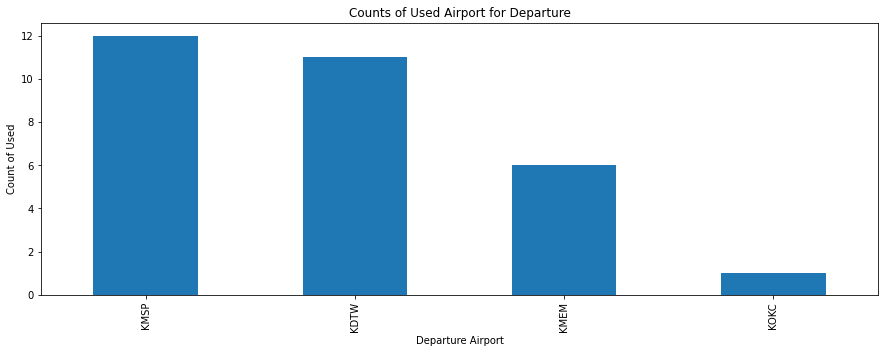

In [88]:
departures['ident'].value_counts().plot(kind='bar', figsize = (15,5))
plt.xlabel('Departure Airport')
plt.ylabel('Count of Used')
plt.title('Counts of Used Airport for Departure')
plt.savefig('departure_chart.png')

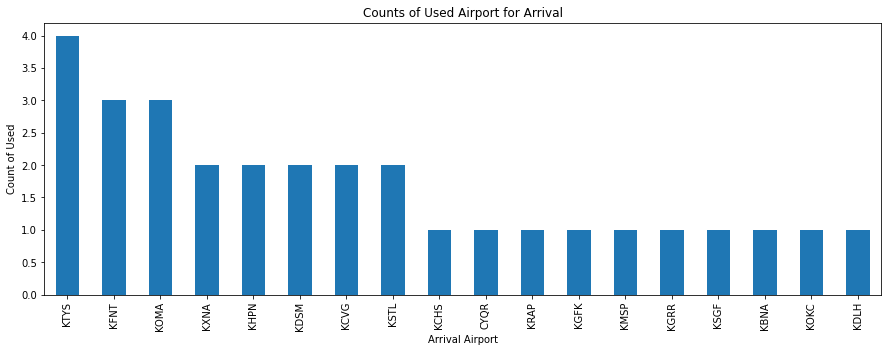

In [89]:
arrivals['ident'].value_counts().plot(kind='bar', figsize=(15,5))
plt.xlabel('Arrival Airport')
plt.ylabel('Count of Used')
plt.title('Counts of Used Airport for Arrival')
plt.savefig('arrival_chart.png')

## **Test to View Image from DataFrame**

To view the image from DataFrame, we can use `.fromarray()` method from `Image` as follows.

The image that is shown below is the departure airport from `flight_10009` flight data, where the pinpoint is located at the runway where the aircraft is taking off.

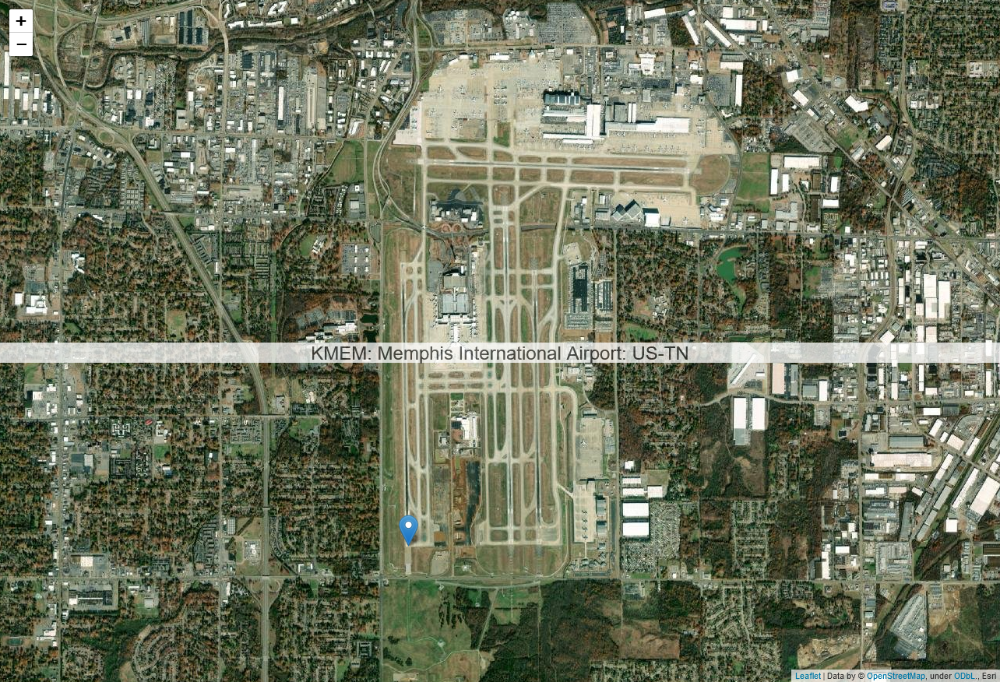

In [38]:
Image.fromarray(departures.iloc[0]['img_arr'])

The image that is shown below is the arrival airport from `flight_10009` flight data, where the pinpoint is located at the runway where the aircraft is landing.

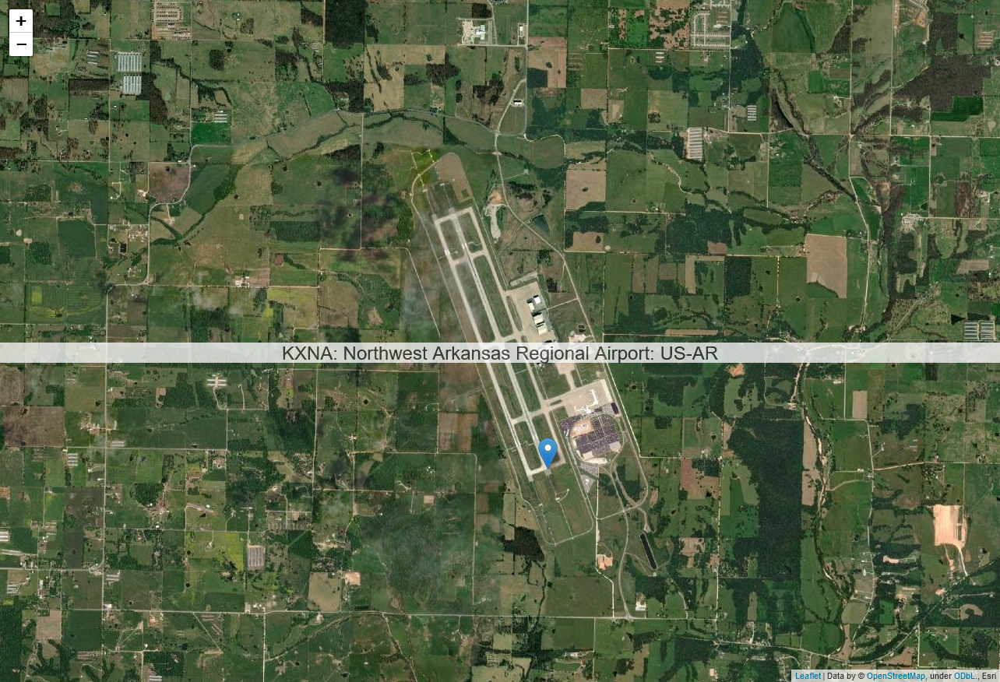

In [40]:
Image.fromarray(arrivals.iloc[0]['img_arr'])